# Filtro de partículas - workarounds - soma

O objetivo deste documento é chegar a uma solução prática  para dois problemas:

* overflow
* convergência




In [1]:
import projeto_pf3 # Seu trabalho fica em projeto_pf. Você não deveria precisar editar este notebook

import inspercles
import graphics_nb

import matplotlib.pyplot as plt
import sys
import os
%matplotlib inline


if (sys.version_info > (3, 0)): 
    # Modo Python 3
    import importlib
    importlib.reload(projeto_pf3) # Para garantir que o Jupyter sempre relê seu trabalho
else:
    # Modo Python 2
    reload(projeto_pf3)

projeto_pf = projeto_pf3

Using scikit-learn to compute nearest neighbors


## Diretório de trabalho

In [2]:
print(os.getcwd())



/Users/mirwox/Dropbox/Insper/2016/Robotics/src/robotica_pf2018/old


Criação das partículas: chamamos a função `projeto_pf.cria_particulas()` para fazer a criação inicial. Estamos armazenando na própria `projeto_pf`. 

In [3]:
n_particulas = 10000
projeto_pf.particulas = projeto_pf.cria_particulas(n_particulas=n_particulas)



    

## Mapa com posição inicial

Você **não** precisa se preocupar com as funções de desenho. 

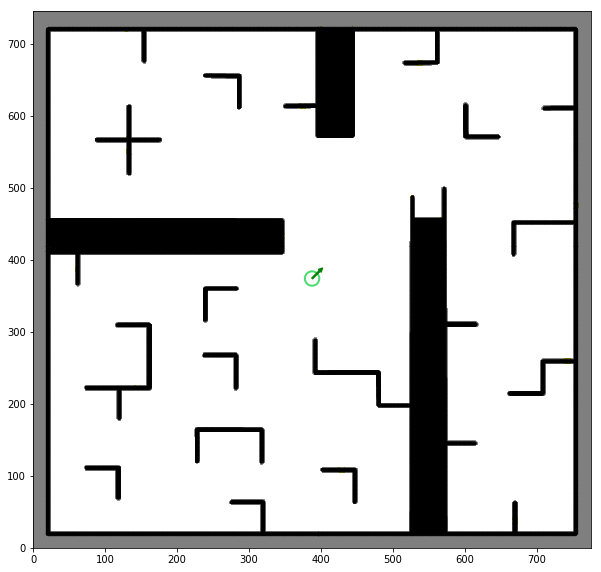

In [4]:
graphics_nb.draw_map(projeto_pf.robot)

# Simulação da imagem do laser

Para simular a leitura **real** do robo, use `inspercles.nb_lidar` passando o objeto robô. 

Você vai precisar fazer isso dentro da função `leituras_laser_evidencias`(que está em `projeto_pf.py`). Haverá uma leitura simulada para o robô e uma simulada para cada partícula

In [5]:
r = projeto_pf.robot
leituras = inspercles.nb_lidar(r, projeto_pf.angles)


O *array* leituras é um dicionário em que as chaves são os ângulos do laser relativos ao robô e o valor é a distância em *cm* em que um obstáculo foi observado naquela direção

In [6]:
leituras

{0.0: 294.8635277547903,
 0.39269908169872414: 326.882444488303,
 0.7853981633974483: 235.0,
 1.1780972450961724: 254.7797781508935,
 1.5707963267948966: 53.033008588991066,
 1.9634954084936207: 83.62002975208812,
 2.356194490192345: 320.5,
 2.748893571891069: 239.74987236476525,
 3.141592653589793: 145.66399692442883,
 3.5342917352885173: 222.9727932602332,
 3.9269908169872414: 133.0,
 4.319689898685965: 136.3814172368416,
 4.71238898038469: 190.2117241391813,
 5.105088062083414: 145.58175093932698,
 5.497787143782138: 134.5,
 5.890486225480862: 146.66414313961934}

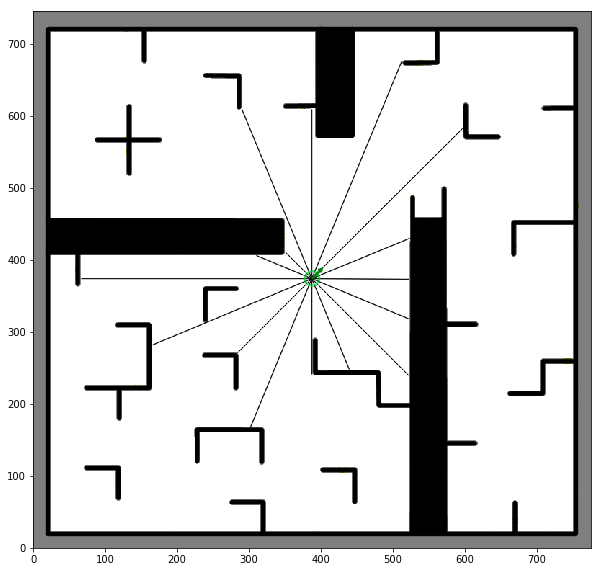

In [7]:

# Você não deve se preocupar com o código abaixo - é só para gerar uma imagem que será mostrada mais adiante
#leituras, inspercles.lidar_map = inspercles.nb_simulate_lidar_fast(projeto_pf.robot.pose(), projeto_pf.angles, inspercles.np_image)
leituras, lidar_map_temp = inspercles.nb_simulate_lidar_desenha(projeto_pf.robot, projeto_pf.angles)

#plt.imshow(lidar_map_temp)
ax = inspercles.nb_draw_map(lidar_map_temp, robot=True, pose=projeto_pf.robot.pose())
#ax.imshow(inspercles.color_image, alpha=0.8)



## Loop principal dos movimentos do robô

Há uma lista de deslocamentos para o robô chamada `movimentos` no arquivo `projeto_pf`. Vamos usá-la para simular o movimento no filtro de partículas




Atenção: quando for gerar os arquivos png da entrega por favor apague todos os arquivos do tipo anim*png antes de gerar a versão final

In [8]:
# No Windows: 
!del anim*png

/bin/sh: del: command not found


In [9]:
# No Linux ou Mac
! rm anim*png

rm: anim*png: No such file or directory


In [10]:
## Atenção: Você não deveria precisar mexer no código abaixo

def simulate(robot, particulas, movimentos, file_prefix):
    plt.ioff() # Desliga o modo interativo, para nao aparecerem muitas imagens no meio por causa da animação

    frames = 1

    leituras, lidar_map_temp = inspercles.nb_simulate_lidar_desenha(robot, projeto_pf.angles)
    ax = inspercles.nb_draw_map(lidar_map_temp, robot=True, pose=robot.pose(), particles = particulas)   
    
    ax.imshow(lidar_map_temp, alpha=1.0)

    plt.savefig("{}{:04d}.png".format(file_prefix, frames), bounds="tight")       

    for delta in movimentos:
        
  

        robot.move_relative(delta)

        projeto_pf.move_particulas(particulas, delta)

        # Simula a leitura do lidar para o robô - versão desenho
        #leituras, inspercles.lidar_map = inspercles.nb_simulate_lidar_fast(projeto_pf.robot.pose(), projeto_pf.angles, inspercles.np_image)
        leituras, lidar_saida = inspercles.nb_simulate_lidar_desenha(robot, projeto_pf.angles)

        # Simula a leitura - versao codigo


        # Simula o lidar para as particulas
        # ATENÇÃO: o "for" abaixo faz parte do que deve estar dentro do seu 
        # leituras_laser_evidencias (parte da resolucao do item 3)
        #for p in projeto_pf.particulas:
        #    leituras = inspercles.nb_lidar(p, projeto_pf.angles)

        # Atualiza probabilidade e posicoes
        projeto_pf.leituras_laser_evidencias(robot, particulas)

        # Reamostra as particulas
        particulas = projeto_pf.reamostrar(particulas, n_particulas = n_particulas)


        # Desenha as particulas


        frames+=1
        
        ax = inspercles.nb_draw_map(lidar_saida, pose=robot.pose(), robot=True, particles=particulas)
        #ax = inspercles.nb_draw_map(lidar_saida, particles=projeto_pf.particulas)
        # Desenha o mapa do lidar como fundo
        ax.imshow(lidar_saida, alpha=1.0)

        plt.savefig("{}{:04d}.png".format(file_prefix, frames), bounds="tight")   
        
        
        plt.close('all')


    plt.ion()



In [11]:
simulate(projeto_pf.robot, projeto_pf.particulas, projeto_pf.movimentos, "soma")

Probabilidades: 
[9.111233340160033e-130, 0.00017520670900376996, 0.00018874322187878903, 0.00040552098657144914, 3.966929816458459e-05, 3.5107127966851736e-09, 0.00017904067247182778, 0.00017849275430123108, 0.00021695712256957113, 0.0002098437191171998, 1.0264619820399674e-10, 0.00010411132605600235, 5.718400493987043e-98, 0.00028627113892420574, 5.554940834171954e-06, 2.28961885480054e-05, 0.00021016359433359918, 7.978013469744901e-28, 8.849853653142896e-05, 0.0002486361979458838, 6.601464232497089e-10, 0.0005139313934964792, 2.3507962548097816e-17, 5.854482807398706e-13, 9.409126916717431e-11, 0.00024145631188277885, 3.21314965186577e-06, 5.69429233835014e-17, 1.350665145548396e-137, 4.5156127092688555e-13, 0.00027695911763826584, 1.5749438417539245e-07, 0.0002382587007162752, 2.2890309707724795e-10, 0.0003147208965181857, 3.7440174154501077e-16, 1.74783513321735e-05, 5.169311911124652e-06, 0.00024201819716741484, 2.4315399891793212e-05, 0.0003733334596514642, 6.352202585305476e-11

Probabilidades: 
[0.000355904472803965, 4.526335037956979e-05, 3.162633767104815e-05, 3.1590713334712446e-05, 1.245012028242629e-06, 6.804674841320967e-05, 0.0002746747749554641, 8.321085796973932e-05, 2.3914214146257755e-07, 2.122862742686844e-05, 0.00010063687589744223, 0.0002737158958321343, 8.5698541793044e-05, 0.00013328285904048426, 3.4884331450577115e-07, 4.775193340541165e-12, 2.75367992576301e-40, 1.003232911529133e-09, 0.00017477997271104833, 5.239942314831199e-08, 1.2661531324822856e-06, 1.4673434034035966e-05, 3.769225512017806e-05, 1.7443881030875102e-15, 1.9576286234653357e-05, 0.0004781228854505552, 2.5423165762564323e-05, 2.262755483150312e-08, 0.0001226341053442451, 0.00012598982857840474, 1.0984790797613075e-07, 0.0001266609950178337, 8.526111074564575e-07, 0.00022485861828769435, 2.3956876872742805e-05, 9.522477790670646e-06, 0.000361098079220824, 2.8290873253056296e-06, 0.00020638432420479316, 0.00017753540408112502, 7.366439955252415e-06, 0.00011621182838168821, 0.

Probabilidades: 
[0.0001075943047187232, 0.0002952853503674415, 0.0003501428011261796, 8.463616861317687e-05, 1.6577876026215741e-46, 4.083973057565348e-05, 0.0001583432069069086, 7.258098696907395e-05, 7.5094263192799e-08, 2.7003976231199254e-05, 4.730543618281367e-06, 3.9933509787518086e-05, 5.824144024060322e-06, 0.0005422288029412898, 0.00011555790967492655, 3.8374572550441425e-09, 0.0002869219974364663, 7.665088332138116e-05, 0.0002961311033496494, 4.633555698768749e-06, 2.1188702523216275e-05, 0.00014276160460859242, 2.475574291304256e-06, 0.00019069411529433657, 0.00015191418990721954, 2.316811285606376e-05, 4.918901108601436e-05, 2.116012254585974e-06, 2.1322182397499442e-06, 0.00015586684304064213, 5.182653115643727e-05, 0.0002556973882527167, 9.732466263051883e-05, 2.5105410180372823e-09, 5.365641363960332e-05, 8.950054919420486e-08, 6.232140576315558e-05, 0.00010901839583607131, 0.00016035415846428082, 3.7639430552296984e-05, 0.00017617510535009723, 4.306827645304054e-08, 6.

Probabilidades: 
[8.920814707336954e-06, 5.46715903762861e-11, 1.2907202103205895e-05, 0.00013143669380950518, 1.3856087903188998e-05, 1.7410738606884788e-05, 2.3828924751196666e-07, 0.0001485370188141616, 7.85972843780308e-05, 1.351615313178658e-05, 0.0001282207903130035, 4.58100825288935e-05, 7.219602241294945e-05, 9.761546434974273e-05, 0.00011832968919572226, 0.00012607011033342164, 0.00029902667479095866, 0.00013147447950412743, 0.0001708934281777967, 0.00012551043613574065, 7.728943103917043e-05, 2.0421114280562247e-05, 3.92820993608962e-23, 3.670686686686342e-05, 0.00014780809518124643, 1.2564184461183538e-20, 0.00011962551980892528, 0.00022299051122419845, 3.15262492565873e-05, 9.054865557890211e-07, 0.00019223228720581962, 0.00010286868295079044, 9.227019673500437e-05, 2.684400355513724e-05, 0.00012760953024892362, 2.644634940521743e-09, 1.1429624983619459e-06, 7.978683996101267e-06, 0.00013865009662122316, 0.00012798301830735525, 0.00012348194601435511, 0.00013461423365174275

Probabilidades: 
[0.00013615141554031775, 9.134950084044454e-05, 0.0001288970776615894, 0.0002890168315117139, 0.00047027741328110965, 4.14439173058145e-05, 0.00011093178659681326, 2.951047501471934e-17, 0.00021019658125807176, 6.145736788423301e-07, 1.7111661307172162e-05, 6.970793812345284e-07, 9.357547243030196e-07, 2.0052457000621838e-05, 0.00019085424436714925, 0.00010406058801152916, 1.707128258489417e-07, 9.902661548916675e-05, 0.0001767101121841376, 0.0001401679152165354, 2.2894693848642395e-05, 1.8030562277245594e-07, 1.4862624026156003e-06, 6.463186560931115e-06, 1.8893475856638544e-08, 0.0002341073936850138, 0.00010099438053900415, 0.0005104145244023508, 7.99263385352664e-05, 4.464763680141894e-11, 5.2964348759368054e-05, 5.19226893082894e-07, 6.747551990889338e-05, 0.0003031933865899721, 8.109083509060844e-05, 6.32016898392297e-05, 0.00010310810177079687, 0.00013556730459113856, 0.00010113149143940336, 0.00021100347832750152, 7.773214924753472e-05, 6.862161968342494e-05, 0.

Probabilidades: 
[6.362305342425535e-05, 9.920192601622128e-12, 0.00014970855099530821, 0.00012382030837421702, 0.0001859712880218744, 7.973314329021103e-05, 5.121464415384422e-05, 9.819062733138883e-05, 1.4471099850379618e-05, 9.30579447592161e-05, 0.00012957544541085316, 2.277007069041604e-08, 8.32764693661018e-05, 9.620857773829741e-05, 2.3075850486578565e-05, 1.7821844577569276e-05, 8.878878632629777e-05, 5.34163934267895e-05, 0.00022489485726255319, 1.545395938552839e-05, 1.496729180443188e-06, 2.908566041826304e-05, 0.00016744698938446996, 7.662689170204877e-05, 8.217737940402798e-05, 2.203567890427692e-09, 0.00015336155833878493, 4.70407142726398e-05, 8.912761119914584e-05, 0.00020883941614818871, 7.432582815963209e-09, 8.963889359865025e-05, 2.630137031600974e-10, 3.808499743093963e-05, 8.941047220190869e-05, 0.00019971721996265917, 8.518568233064005e-05, 2.736016133988764e-05, 9.460795991532448e-05, 0.000188121763162162, 4.0575093217729465e-05, 0.0001423830625930475, 0.0002051

Probabilidades: 
[1.731557147052078e-06, 4.870870023256051e-05, 0.00017885856951685837, 2.1794904212477484e-07, 0.00011935832162541077, 0.00015298643495521486, 4.707963893436002e-05, 0.0001557708112797585, 0.00019136688449435305, 2.064200325918404e-05, 0.00012957093359341383, 8.188718471321336e-05, 8.690037014617795e-05, 0.0002774996969513941, 5.3099128860091754e-05, 6.0189910761396234e-05, 0.00010259004746899054, 0.0002227369349554123, 5.464692522907805e-05, 3.62253076109081e-05, 0.00014045853627563167, 3.5986509376198214e-05, 0.0001293208605198678, 6.853822614005926e-05, 8.503657969119356e-05, 3.501039095709409e-05, 7.077864787416997e-05, 0.00016927131585180763, 0.00043718230173557445, 3.9433671026954244e-05, 9.306004327538492e-05, 9.590183263774485e-05, 0.00021386765213692144, 8.492063171502178e-07, 3.274507056517795e-05, 3.146714964757268e-06, 1.719075038151737e-14, 0.0004712580032057283, 0.0001311206412890358, 9.6643426468598e-05, 7.957667860375267e-05, 0.00013097266592356914, 0.0

Probabilidades: 
[5.3448683780718184e-05, 6.861571316266182e-11, 0.00018811754963782174, 1.3271150332711156e-05, 7.847334323746477e-73, 0.00016042557684302992, 7.050831906792812e-05, 0.0002177586453143187, 9.561398160223066e-05, 0.00012115896528556014, 6.854466479525605e-05, 1.554509726142527e-05, 1.1722138520695427e-07, 8.763998115714185e-05, 0.00014539926941613526, 0.00017125194064662792, 5.516044317619703e-06, 8.534786636531973e-05, 5.9543827047980416e-05, 0.00010359823354930897, 0.00029078335381008423, 7.041334737918169e-06, 2.4114338047827903e-05, 6.652226110603231e-05, 0.00018140725835442603, 4.6859453083168304e-14, 3.4567485002925316e-05, 0.0002341262509481348, 6.637863776526018e-05, 0.00018079983357582313, 0.00021418533069395959, 0.00014369050796617447, 9.388746769182878e-05, 3.034542256212631e-25, 0.00014177425818220142, 0.00037778055369775543, 0.00010748832552676982, 5.185535174025e-06, 7.053563212364995e-05, 6.257731800653249e-05, 2.3092008327686283e-14, 3.728119705386719e-0

Probabilidades: 
[0.00011222905273045082, 6.252765220216381e-07, 9.69025880777801e-05, 7.160238243430274e-05, 9.140952348817896e-05, 0.00024932046465117195, 5.881763221442145e-05, 0.0001688974381236182, 0.00016616889969520209, 0.00015771324999375158, 7.313307974315706e-07, 0.00019972344615174788, 0.00014335322106721345, 5.84700229883547e-05, 0.00012204279357562399, 0.00019112175972440642, 1.178802751190281e-05, 6.371359119425504e-05, 0.0002545917709451613, 0.00010607930747780739, 0.0001669489718257815, 1.895396561868385e-05, 8.254587468268056e-05, 4.9302204211568476e-05, 1.4529507547838614e-05, 0.00033239463930464076, 0.0004838048701067799, 2.744334114320505e-05, 1.971557579514247e-08, 0.0002683486502512174, 3.61864014648592e-05, 4.9367544071990745e-05, 0.00019802519180130512, 1.731417671249174e-10, 8.57875026630736e-06, 6.860684534319833e-05, 7.661297587019657e-07, 9.066273846946821e-05, 0.0001305260230448954, 0.0003069041854666875, 8.054319871023813e-05, 6.778422699422947e-05, 3.2283

Probabilidades: 
[0.00014045313534924583, 0.00012890034631297408, 1.8423273368793413e-19, 0.00011506614189802169, 7.667487010061869e-05, 6.726208592403475e-05, 5.549838731798603e-05, 6.13858327599762e-05, 0.0001412651055295659, 1.4537756183497868e-05, 3.7108347359691646e-07, 0.0002383407003730861, 6.35484307241962e-05, 0.00013787152155264587, 9.711490665398993e-05, 8.08241058025217e-05, 1.0866144579011851e-05, 0.00011707132418096589, 5.695541692930214e-06, 5.708325416844847e-05, 0.00018702694743869978, 2.0420960397112858e-06, 2.037448092742878e-05, 0.000356019985458944, 7.991294465161122e-05, 8.429618317896502e-05, 1.4127832938014194e-05, 0.00014232745103672954, 4.535311955020532e-05, 7.982061372481902e-05, 0.0001768150694706468, 0.00016168286452095072, 0.00011611199247165794, 0.00010048891747058726, 3.8163307073523105e-06, 0.0002751927190064629, 4.589830523314526e-06, 0.0003485900679212968, 5.239943400916063e-07, 0.00018817072472939725, 4.754262753525761e-06, 4.030579114637813e-05, 7.

Probabilidades: 
[8.744190169150165e-09, 0.00016379032598531172, 9.047851402559745e-05, 9.991470494439925e-05, 0.0003262475503166307, 9.652205683115509e-05, 3.581312576715148e-05, 0.00021793305095284556, 6.679544773951788e-05, 0.00010883334583076174, 7.485594409876237e-05, 1.3618318039090217e-05, 3.125886448454306e-05, 4.760942183498799e-06, 6.4834116654032e-05, 3.746860833205429e-11, 9.672584362501034e-05, 0.00012935202682476068, 0.00014069529939439557, 3.331573510747775e-08, 7.595813629612962e-05, 1.0503656241383941e-06, 0.0002280356518965949, 0.00010449486593102973, 4.6268948463076935e-11, 0.00011064324441391598, 4.2199715799264866e-05, 0.00018083640332102613, 4.4513457073646115e-05, 2.971936674343483e-05, 0.00024064143667851392, 0.0001413527359909095, 0.0002768198855980043, 0.00013670914749472612, 1.976318471744096e-05, 6.282880537839805e-05, 0.00016908902542107598, 0.00010646893741043466, 0.00010756152758083927, 0.00016922871360002055, 5.509641923202308e-05, 5.056389598619817e-05,

Probabilidades: 
[6.945086367813307e-05, 0.00016019494866436227, 2.0615469806923234e-07, 5.94768610058893e-05, 0.0003133302626717308, 5.110634195911255e-05, 6.667999293650464e-10, 0.0001525273979901763, 0.00010911238887957192, 2.5011123108126525e-05, 0.00018667353520479625, 4.321106999452732e-05, 4.276543136183666e-05, 0.00015514451289650428, 3.577452498921681e-05, 0.0001410048493190508, 7.701650855253561e-05, 0.0001581475102677342, 6.841751417905428e-05, 7.227270907458544e-05, 2.187749438266408e-05, 4.5107343188691834e-05, 0.00013696238432675547, 5.66863568728418e-05, 0.00018582701167853285, 0.00015418624459833616, 4.9832819323597025e-05, 0.00014282650904670198, 0.00010019860456084468, 0.0001094085000237542, 0.00019836272318085363, 0.00025387783740460026, 1.1158479611001053e-05, 0.00013351454610434127, 1.8093715200778013e-05, 0.0002771051318769781, 0.00011561318702733518, 0.00011711304364288633, 4.1873168376679214e-05, 0.0004383905766152249, 0.0001363554189177273, 1.6057189928156067e-

Probabilidades: 
[7.233283305031127e-07, 2.0379409735271587e-08, 0.00013762704280346528, 0.00011643813335454374, 0.00011637301608782632, 6.729199877495604e-05, 1.8991530031498048e-06, 4.4666741633622815e-07, 5.5346314214055255e-05, 5.189407212508235e-06, 9.435419347753816e-05, 9.278009771044236e-05, 0.0001253233645384134, 6.491433708555548e-08, 0.0001257382668869855, 5.967768063769908e-05, 5.247080767154827e-05, 3.660128374806657e-05, 7.022589987732175e-05, 1.816473923724422e-05, 1.9454833133338225e-05, 0.00023457408694547006, 0.00022009183043052518, 0.00011475291963833567, 0.0001022969324080176, 0.0002716640548290733, 4.722341253531671e-05, 7.730063174042322e-05, 9.472255799226699e-11, 0.0001359286751471906, 3.5340902315117735e-05, 0.00010670736532129046, 0.00015464775746143347, 9.047382663581489e-05, 2.8315676026605967e-05, 0.00013161454175806777, 0.00013504637549196662, 1.8113667628834582e-07, 7.908131730509021e-05, 0.00012646111508506758, 3.387428541098345e-08, 4.4195294875065954e-

Probabilidades: 
[7.847136183947852e-05, 4.119515069145805e-05, 0.00016534421094851755, 1.0549444249739606e-05, 6.595813204110244e-05, 2.8980421685135365e-05, 1.2920468862861054e-08, 9.565559519762555e-05, 0.0001337020587232514, 0.00011549521076942477, 9.218880862135346e-05, 0.0001295953837592769, 4.033531986321559e-06, 5.048846975015385e-05, 2.6844803629879655e-05, 9.823604333666409e-05, 0.0001281101969874525, 3.3398096600083965e-05, 0.00010437539877637709, 0.0002020997383900502, 3.644147070871665e-05, 9.496928834577868e-05, 0.00027444790911524314, 0.00018427732014304982, 8.57499613329358e-05, 7.235144390619659e-05, 8.023855692014208e-05, 0.0001430816983520229, 0.00018406056441332543, 8.94743811974436e-05, 3.741120118184146e-05, 7.812401530460601e-06, 0.00019069034483223225, 9.25657567926755e-05, 3.8312740816139805e-05, 0.00013941146179846385, 0.00015755230618797646, 1.2588669602697463e-05, 6.435487481884603e-05, 0.00010103062193702726, 2.966393664674172e-05, 0.00010751304784736348, 0

Probabilidades: 
[4.7045899875030354e-05, 0.0001441481029073966, 0.0001090171626261059, 0.00010708135083769795, 8.434874319676836e-06, 6.164263107136876e-05, 0.00017120036801984256, 0.00014286580047926585, 6.744687359018888e-05, 7.48927131320025e-05, 6.444147460464187e-05, 3.4198469552368033e-06, 0.00021240720638876926, 8.585779237382457e-06, 8.461156345542371e-05, 0.0001197599484175775, 7.599211598023265e-05, 7.103621891707127e-06, 5.399408498303741e-05, 0.0001133996177075662, 0.0001325217903888166, 0.00010103617706413561, 9.714515897538208e-06, 4.443198206868224e-09, 7.197590217387363e-05, 0.00012800156948358397, 0.0002579398886895434, 0.00018658872603427318, 0.00012146960230134976, 0.0001688366534608393, 0.0001305487492001778, 6.852926245738334e-06, 0.00012521994109971062, 9.546093210604408e-05, 0.00012948010771705805, 3.753262295235667e-05, 0.0001652831449859571, 0.00013802307664378553, 2.6290074676445085e-07, 8.724019612282189e-05, 0.00011755267068332405, 0.00022053460606153363, 4

Probabilidades: 
[2.8831579580228688e-05, 0.00012420229950371278, 2.7252545075092558e-05, 5.2241351922985975e-05, 0.00023338205540600042, 0.00021302034713466248, 7.032660423305297e-05, 0.0001241955401055825, 9.92213847568918e-05, 9.641315730970377e-05, 5.986308762982854e-05, 6.350623502650851e-05, 4.742102611047415e-05, 1.803299386685981e-05, 7.518846653269427e-05, 1.387235757333917e-05, 0.00010032670356850845, 9.639878126610542e-05, 0.00017239517966868782, 0.00022554441966308545, 7.39490205343819e-06, 1.6072229429244603e-05, 5.404765134321015e-05, 0.00021972410959512011, 6.692502684095089e-05, 5.1177986572606414e-05, 8.243481852317682e-06, 8.565916905879306e-05, 0.00020949561566123884, 0.00013435913598603492, 6.153955404178965e-05, 2.140336170317947e-06, 3.949087436432465e-05, 6.03800884303668e-05, 0.00015870439144261215, 0.00020522801421400146, 1.7315309765280088e-06, 0.0001080396959971572, 0.00010279409000486129, 0.0002115434358262358, 8.048796214456472e-05, 0.0001547013620602424, 7

Probabilidades: 
[1.667701289981191e-05, 0.00014729500781863295, 0.00032056092370690074, 0.00018539938513487643, 8.392381979209742e-05, 0.00013976013587420433, 0.0002870672017249222, 5.583688924652456e-05, 0.00023728643579938382, 7.260760162077893e-05, 9.73101457965072e-06, 2.8987184198105023e-05, 0.00016256106592822529, 7.137350142398372e-05, 5.710946726118341e-05, 6.557387578472984e-05, 0.00013742217554884952, 0.00012626646074704768, 7.633204200063869e-05, 0.00013576634466429098, 0.00015811130763650292, 7.508997688490725e-05, 1.8818854053664084e-07, 2.470361250146161e-05, 3.497321107818974e-05, 3.3139495220156528e-06, 4.747937288267082e-05, 3.4591943944292e-05, 0.00019266161480058778, 0.00014148953038814406, 3.801975548972363e-05, 7.854223948929405e-05, 9.626704328693841e-05, 8.434937771851089e-05, 3.682694019169981e-05, 0.00014282566796291395, 0.00012807478176991616, 0.00020625708463157508, 1.0104294493846965e-05, 1.0893774433209346e-05, 1.2814967804564128e-05, 0.0001500315860711206

Probabilidades: 
[0.00016181954204039432, 8.209116785839083e-05, 0.0002941532297255275, 1.3901556558988688e-05, 7.27441716993218e-05, 5.36967913594387e-05, 9.304630014799274e-05, 0.00011167704905001695, 1.6822614113893735e-06, 9.416670892594232e-05, 1.9521425545776776e-05, 5.692185638622707e-08, 3.494715198641842e-12, 0.00018926161865746353, 6.416054392206033e-05, 6.8758571617374875e-06, 0.0005479106943114384, 0.0002328405783537931, 0.00019570262488906076, 7.726748200844003e-05, 7.171157020371414e-05, 5.279430462358958e-05, 0.00015178553859705824, 0.00027549174448455543, 0.0002666897001738995, 3.291797579107137e-11, 0.00031053799390752936, 8.067218412761923e-05, 0.00010774588338066649, 0.0001126342790649727, 0.00010406436639256459, 0.00011053222455466766, 4.327366939912416e-05, 4.211176411093454e-05, 9.791221171027771e-05, 0.00025220146681298743, 0.0001260430441776426, 0.0001363190095994893, 4.2726787563201444e-07, 9.028105868704598e-05, 7.25063542908297e-05, 0.00011821828246986137, 0.

Probabilidades: 
[3.2498237363591984e-05, 0.00015314468462436043, 8.988142305250808e-05, 0.0002080928246395598, 1.5454606191023164e-05, 0.0002136148764412512, 0.00019548860902083142, 0.00013658304924013485, 1.5046873205053764e-11, 0.00011505964248273289, 7.467330377847074e-05, 3.7690065972635415e-05, 0.00010865273810605588, 0.00014859926180248325, 0.00014659177481557388, 2.2328970441560095e-05, 3.387405207556145e-05, 2.6232523713451507e-05, 0.00018511809329039474, 2.5771245456266963e-05, 5.1846056155895056e-05, 0.00013399481526501865, 5.0765723643708025e-05, 4.2874055793220856e-05, 0.00021154595977880897, 0.00013026076751743209, 3.9350420838195246e-05, 0.00020849097896559127, 6.458796163939674e-05, 9.780764934577454e-06, 0.00031477002100572653, 6.373142237707092e-05, 4.739827899493053e-09, 4.0503886641288324e-05, 8.924324960054418e-05, 2.0053166376412836e-05, 2.5890013051846504e-05, 1.0336073670643615e-05, 0.00019071446701206653, 1.790222749539733e-06, 0.00011799462738380463, 0.0001536

Probabilidades: 
[4.0192300841588695e-13, 6.783481247925819e-05, 2.6317912759890533e-05, 5.7220178379248314e-05, 1.000205559492824e-05, 0.00023629182927302546, 0.00010654974555377869, 4.146392783603813e-05, 0.0001481230475666708, 0.00011975588371632418, 0.00024985804924649137, 0.00012196889864122031, 0.00011526352500120189, 0.00011181080338042124, 0.0001994794258878069, 0.00016981435728942896, 4.420199111041051e-05, 0.00020399333043226306, 2.0630111863490097e-05, 7.695761435320956e-05, 0.0002265502143737235, 2.4187258954899046e-08, 0.00010562807256176646, 6.196943507138559e-05, 9.7167634204567e-05, 8.85731207785622e-05, 0.0002585369801554043, 0.00019346990872603335, 0.00010745932526884817, 0.00010876000537766638, 0.000235398694291991, 0.00010673259189324756, 0.0002238608273094364, 0.00010209348176301288, 2.342257684404389e-05, 0.00024181112016131832, 0.00026145941741461835, 5.407589261109068e-05, 0.00010717583147058603, 8.087383690209057e-05, 9.692821023445649e-05, 6.483788644305557e-0

Probabilidades: 
[5.6205782322163344e-05, 0.00010295646671804302, 0.00012633238224610155, 0.00014606411991444998, 0.0001167991281083208, 1.5993555291253657e-05, 0.0001708581435454823, 0.00013572249677202815, 4.6829016907020924e-05, 3.9649731729849346e-05, 0.0002046946987447869, 2.7733309615603443e-05, 1.6676830488499356e-06, 0.00014741974356885702, 0.0001462890157699198, 3.536141063118542e-05, 2.7424202252443607e-05, 0.00012975226248314523, 0.00013861220358704298, 5.33671991851957e-05, 2.645838294164628e-05, 0.00014164987612845647, 0.00016797743179740912, 9.892585913810772e-05, 0.00012361401468405025, 1.1494316962662516e-05, 0.00011104852466022154, 0.00011585045618342, 4.731875783623297e-05, 0.00014785020796359618, 2.0462779126611542e-06, 7.245279949049554e-05, 0.0001210869342191605, 0.00012338840213142608, 0.00010168495525003307, 3.442329912627916e-05, 0.0001420947990313903, 8.336890545026723e-05, 3.4351943104754913e-06, 0.0001623606262800318, 0.00011657428782205773, 0.000122839492618

Probabilidades: 
[0.00016557938037673893, 0.00017980710085947977, 8.839915301113353e-06, 0.00020700970294805217, 0.00017784660809112282, 0.00010570549683973085, 9.968919032828052e-05, 0.00011715702390977583, 3.2037553405532234e-05, 9.659868593748025e-05, 6.373280113020172e-06, 1.739575281373454e-05, 5.222208692866393e-06, 7.580379271526549e-05, 4.694310777841862e-05, 0.0001764707635262136, 1.4186349875321722e-05, 0.00010021866430281592, 0.00019467400990728768, 1.5950228360620955e-05, 0.0001060192280026671, 9.291642095351823e-06, 6.771549341140189e-05, 0.0001624069764236843, 0.00016943934363062755, 6.49405993761422e-05, 0.0003339525688034407, 0.00016121131071360187, 6.921948692669016e-06, 3.5807909767904225e-05, 6.7805123969456684e-06, 0.00010506099718058275, 3.2427471793353184e-05, 0.00029127170346269257, 0.00011765491877880374, 0.00015085318563937936, 0.00012278303059962131, 0.0001895144030275353, 8.345818166835487e-05, 0.00010090581777669383, 7.589763465417167e-05, 7.269467088092841e

Probabilidades: 
[0.00021033889532705725, 8.71159699508328e-05, 1.3515709098006247e-08, 1.6079354478504766e-06, 0.0002903446654736577, 9.779427354490098e-05, 7.016041340163665e-06, 2.1868747557539057e-08, 2.3508445331490382e-05, 4.6393892785041074e-05, 4.08148625993644e-06, 0.00040059132835202726, 3.458237632013693e-05, 0.00011382391247548937, 0.0002178301949733665, 5.570555692003918e-05, 0.00020645210695855923, 3.3919493061875636e-06, 0.00013867004259328073, 0.0002937268141764661, 5.508853182369943e-05, 0.0001163935240455169, 0.0001550832804890873, 4.189720708348491e-05, 3.1710219317664025e-05, 0.00032395999180020313, 0.00015286092585160477, 0.0001053012273628873, 2.53445094916791e-05, 2.0613458010627384e-05, 0.0002151139163663753, 0.0001257771544338458, 4.048694887500544e-05, 0.00011416149047259981, 0.00020908115270240737, 0.00018775716244821838, 8.906084230087243e-05, 3.580813322560338e-05, 0.0006651068221967711, 3.532710419050931e-05, 3.743528939142578e-05, 0.00015807461640773415, 

Probabilidades: 
[9.682701918635037e-08, 7.391431580713753e-05, 0.00012727586486939443, 0.00012016331854706342, 3.095001825388673e-05, 6.113464597772433e-07, 9.13276479347993e-05, 8.693674553841464e-05, 0.0001492384566702071, 5.331854817155155e-05, 6.855773045306011e-05, 3.2047501103441536e-06, 0.00013451991102471752, 8.061895196361409e-05, 0.000291000085864905, 0.00025052927830228436, 0.0001493109364006475, 4.907157030240794e-06, 0.00015176220133568424, 8.795416611324612e-05, 8.889932097999457e-05, 0.00012656375258906548, 4.386912996004637e-05, 9.021639799533552e-05, 4.745654053934216e-05, 0.00031347720305476245, 0.00010361754945088223, 6.50178264920354e-06, 6.93753813795821e-05, 0.00010948922905354842, 9.766272418303262e-05, 0.000114854655211032, 0.0002644963669289512, 0.00011130236821496094, 0.0002503360142792094, 3.623867337021002e-05, 0.00026995485490285905, 1.3763688044654062e-07, 0.00024475539661956134, 7.451752707133394e-05, 0.00015123243686746335, 9.535041154178657e-05, 6.3528

Probabilidades: 
[6.706079496554993e-05, 0.00016850099974378022, 4.5538457403393045e-05, 1.530471305270199e-05, 0.00024395508045519393, 8.870229068161626e-05, 0.0002386834735983174, 0.00017689821733902214, 8.246509696358537e-05, 0.0001228351424215834, 2.5483464102637356e-05, 0.00021114117979005936, 5.84858622046536e-05, 3.527590668429729e-05, 6.964771491187977e-05, 7.986247069499506e-06, 8.396551229612853e-05, 1.082588867260767e-06, 3.87830265329197e-18, 0.00011610355835157756, 7.193304996071157e-05, 9.101145995180628e-05, 8.035709264245377e-05, 3.217027914984304e-05, 6.975667032335188e-05, 8.076204738960327e-05, 8.313888255236558e-05, 0.00010945188004958249, 1.5799579064779694e-05, 0.00013121219089222457, 4.652649873150234e-07, 2.616746157412329e-05, 7.647749118087295e-05, 0.00011383010238591715, 4.955661573065058e-05, 8.993856319332962e-05, 9.9637178809301e-05, 6.23350786076753e-05, 2.9769089042186797e-05, 0.00011336085816361799, 0.00012759381272289092, 0.00015339651598204348, 0.0001

Probabilidades: 
[5.5522061812208505e-06, 0.00016436414988349886, 1.822672831115541e-05, 0.00010994188983653044, 4.64544057276152e-05, 5.478492582996774e-07, 0.00021532100552515825, 4.838385024319263e-05, 9.502256196287502e-05, 8.210054141557916e-05, 0.000146046982679248, 0.00013662857783713095, 0.00011661138148587244, 0.00019369028920442668, 0.0001599385137132895, 1.414528969013476e-05, 0.00012932617278042026, 1.933656629387527e-05, 0.00011458730989805517, 0.0002327208826116028, 0.00015170157644918108, 3.832532161480442e-05, 2.7081098020668734e-05, 0.00012091317892633806, 2.287962878247306e-10, 3.868993445029776e-05, 5.081867824098003e-05, 0.00011470927875199892, 0.0001843741306121022, 9.688165965186516e-05, 0.0002420826495257757, 0.000130292955075404, 0.00012059758041513, 5.099605259512529e-05, 1.0279434979604893e-05, 5.5436890862576026e-05, 6.364272488360427e-05, 0.00013001768808523946, 1.0227277786088582e-06, 7.288857516428534e-05, 8.184838044683046e-05, 4.0307182596906534e-05, 4.5

Probabilidades: 
[0.00012240867116482165, 4.4192669294642494e-05, 6.114225031604917e-05, 0.0001373136247715317, 0.0008558286381005269, 0.00016900401743112541, 4.663328205540454e-09, 0.00024433934946132825, 8.410731131875642e-07, 6.009764978485287e-05, 8.622305343278999e-05, 6.137327639942204e-08, 3.3926956286880766e-06, 6.168562530206294e-05, 0.00024251004264199433, 1.836976535572404e-06, 0.0001138753973423224, 0.0002221088114108968, 4.104509107600399e-05, 0.00025599332631548395, 5.718960786584486e-05, 1.9807773330832287e-07, 0.00015147227884100052, 6.393089322047731e-05, 0.00013976312352949552, 5.06641223541264e-05, 0.0001726133559860006, 7.333418468196455e-05, 0.00015434922606647538, 5.3719028322421236e-05, 0.00011479728413092696, 3.5161404688210616e-06, 7.76111179802728e-05, 0.0001301961637546188, 1.5828978957295743e-05, 1.0720300370466713e-11, 7.87552132736509e-05, 6.270899482624118e-05, 0.00010344312725972902, 6.080532380506791e-05, 0.00011394332289511407, 6.484242702880159e-05, 8

Probabilidades: 
[6.534350157157503e-05, 0.00016704157498802967, 7.32533128162413e-05, 5.304854553581673e-05, 4.8831137080062525e-05, 0.00011089068101246458, 7.658937529403917e-05, 0.00039056420987419277, 0.0001250387317025836, 0.00016470640971752855, 1.0626541675654346e-06, 7.577181744497073e-06, 8.445356943664596e-05, 6.397017183496552e-07, 1.0584936613382784e-10, 0.00010985113552954767, 9.883581739681104e-05, 9.094167052245148e-05, 0.0004886729575416905, 7.212377498219006e-05, 0.00010195596125423835, 0.00017622253190279692, 5.350533305042225e-05, 0.00021680303936228256, 0.00016781167908893154, 2.0091836218037473e-05, 0.0001337319919981439, 6.607873248465876e-05, 5.5097884175022875e-05, 6.104923757446034e-05, 0.0001279445754365459, 0.00010286549579925983, 9.30258050796499e-05, 0.00010360309570018158, 2.4542673315494464e-05, 0.00020262702663409885, 0.0002416188885116622, 2.3002740058006736e-05, 8.115831526562894e-05, 2.4809692191960172e-05, 6.165132401891925e-05, 1.1199060816073998e-1

Probabilidades: 
[4.6386453853983264e-05, 6.951489272256811e-06, 6.581152880260051e-09, 9.354151000295237e-06, 8.276665861357751e-10, 0.0005866569309789751, 5.0427388256015564e-05, 7.232640788051513e-05, 6.321785223101834e-05, 4.277156214085902e-05, 5.926026477272896e-05, 7.256252006267173e-05, 5.521513378642625e-05, 0.0001502850123119748, 6.143682548010162e-05, 0.00010089272703382225, 3.378819959182505e-05, 9.509524867723094e-05, 4.275412403035393e-05, 0.0001976851754670817, 0.00044778182193544745, 6.457169694570757e-05, 0.0002556429562159753, 9.853778553299023e-05, 1.851598820488517e-05, 0.00010891319736662853, 4.083799917319845e-05, 3.62527988063254e-05, 4.085889843798892e-05, 0.00010859311973112375, 0.00011400230025972713, 1.752306131392237e-06, 2.1568494810012568e-05, 0.0007047161122639952, 3.3292508417259924e-05, 0.00013936082962267017, 0.00022685584819564115, 6.12218361091324e-05, 7.628851693286335e-05, 0.00012507898584384326, 5.39282457622823e-05, 3.2265671116070325e-06, 9.2228

Probabilidades: 
[2.8053511401647182e-05, 5.251132669430927e-05, 1.1744348999027919e-05, 0.00018919404863312406, 4.7276029748490576e-05, 0.00020815644615707876, 0.000157446443663335, 1.9518830359969652e-05, 9.209988332578338e-05, 0.0001326036679932921, 7.054002714377633e-05, 0.00015016514905059889, 5.306397422568605e-05, 5.2978832385067825e-06, 9.81895252065734e-05, 5.18014529592318e-05, 2.384033470151823e-06, 5.125966566876254e-05, 0.0003286564466301244, 0.0002460353040243978, 4.4170005180580275e-05, 0.00013639478573483844, 4.36746071990223e-05, 5.3065424368088e-05, 7.988315400450275e-05, 0.00044546986578353307, 0.00023592430454402302, 4.5403927261606046e-05, 1.1736272688955367e-05, 6.250384956738147e-05, 4.620762613975401e-06, 5.290416758230504e-05, 0.00011482789967709357, 0.00011984806385253754, 5.3279565835206045e-05, 8.855964698480541e-05, 4.211777972912536e-05, 9.577679018764994e-05, 0.00025095134952554763, 5.256004929169865e-05, 2.01572630471263e-08, 4.739856399352934e-05, 0.000

Probabilidades: 
[2.089150523520254e-05, 0.00010939911169601854, 0.00015849547605412053, 0.00022362002777638403, 0.00022032639739853185, 0.00016657619876634403, 8.635279174362615e-05, 8.10608299400058e-05, 3.8816147423721386e-05, 1.1397463362425829e-12, 6.211591291393821e-05, 0.0002568270311985873, 4.116988212715633e-06, 0.00038867101898795205, 3.426535116371708e-05, 0.0001579587160803918, 1.8855480420363843e-08, 4.111282640676173e-08, 3.795584094815585e-05, 2.181967277279742e-05, 5.384974965552405e-05, 1.589133995828103e-05, 1.8050782752998657e-05, 0.00012876193550466006, 4.9936236885409825e-05, 0.0003464903115605919, 1.7667949963630083e-05, 0.00044482474561917065, 5.4140359910266514e-05, 0.0003299402546557689, 2.6797475408550727e-05, 1.0694328054725854e-05, 0.00019767637561310625, 0.000153846117769059, 5.372700307042413e-05, 2.7244739223684072e-06, 0.00011838046123992587, 9.053434464285708e-05, 2.194719702427827e-05, 1.8428577325572528e-05, 4.243507709178976e-05, 3.951961179428433e-0

Probabilidades: 
[3.0127473259968522e-09, 8.751643266305369e-10, 0.0002971562001118311, 0.00026919242708757697, 0.00014917192529712245, 0.00017756287086886753, 0.00020152739994791337, 9.316934595788037e-05, 9.131857475182654e-05, 5.954699186031653e-06, 4.4414095686188565e-05, 8.692381800968422e-09, 0.00021942840136740958, 2.4223381816248203e-05, 0.00021826252804353532, 0.0001382195184658908, 4.706033479962085e-05, 8.182937059665482e-06, 4.6518816849831955e-06, 8.194865928441334e-05, 7.861949747719456e-05, 0.00019885661670040458, 0.00013342974156987833, 5.024308457672396e-05, 0.00021968473450259326, 4.968904641414597e-05, 6.349612716299105e-05, 0.00024016897109720503, 0.00016836845782248227, 6.375813122595504e-05, 1.2790395159008162e-06, 7.723512160919267e-05, 0.00013088477471051465, 0.00018495846787193552, 4.68850099605269e-05, 2.3567661677983607e-05, 6.082117759734808e-05, 0.0002281766265661376, 1.1479395770118709e-12, 3.3865409863480315e-05, 2.4552641456329376e-05, 0.0002258586250473

Probabilidades: 
[0.00011612655604081652, 9.211766053626627e-05, 0.00011935605898083504, 0.000192929407826922, 0.00012192196402080333, 3.67466508845908e-05, 7.984196186436285e-05, 3.2478764257824184e-05, 5.457474219840071e-05, 0.00025864154630086207, 0.00032704434526894215, 6.503486863563341e-05, 8.319508053415742e-05, 4.689942181273607e-05, 0.0001762519170345276, 6.584108462232126e-05, 0.00013699073318123505, 5.1618814513724316e-05, 0.0001244240308727083, 0.0001716615461797949, 1.5414807257791614e-05, 0.0002433325118920605, 0.00011820234146848771, 0.0002049545707776995, 3.3107348359475726e-05, 0.00014920514031789578, 0.0002755046571028707, 4.999036449424547e-05, 1.0757780290912723e-05, 2.561455998316297e-05, 1.2465859026295723e-09, 5.728846229950444e-05, 7.782140154742503e-05, 0.00023340722022831576, 0.00014876716503683105, 7.084579417440971e-05, 7.369087910217213e-05, 5.2593362148390306e-05, 4.086369828941218e-05, 0.0001880006930399458, 6.5913015008169e-06, 1.3327522148808338e-05, 0.

Probabilidades: 
[7.38464161618172e-05, 2.305808080111728e-06, 0.00012310312560983382, 4.4239873160398146e-05, 3.3612542443591384e-05, 2.558295348432131e-09, 6.138780319484656e-06, 7.188358940906542e-05, 0.0001044240795856354, 7.052049591013869e-05, 0.00013477276715607875, 0.00010002853623968318, 0.00022765468138242765, 6.248233260175442e-05, 6.488405154716653e-07, 2.219081445235192e-05, 0.00010506404455930232, 2.935154432160866e-08, 0.00027868857926835857, 4.8687797491848665e-05, 0.00014268545031365798, 9.611356658265166e-05, 0.0001353925346553815, 9.72088483597246e-05, 0.00019593811273733462, 7.681334802986808e-05, 6.27399264165936e-05, 6.212646721122153e-05, 0.00012079478646828527, 7.241899441715101e-05, 0.00015765704039497825, 6.733017903948119e-05, 2.129003457014059e-05, 5.2095676749679776e-05, 7.670363453690906e-05, 6.87707525256144e-05, 8.62897686493034e-06, 6.494919727294962e-05, 3.5123195131255117e-09, 0.0003622343979072961, 8.09417818508128e-05, 6.411583768896858e-05, 7.08026

Probabilidades: 
[7.268407949457185e-05, 0.00025186235312705954, 0.00014421777198509093, 2.7593290453565633e-05, 2.281138168519963e-05, 0.00013688102667682724, 3.59966448732703e-09, 7.4665730069905715e-06, 3.967912536273016e-05, 7.822433017530392e-05, 0.00010341070599339737, 0.00019226148753350553, 0.0001092376385654959, 6.046136850302287e-05, 0.00014592328830963043, 1.108039030659185e-06, 3.8865316043396784e-05, 0.00013634863515688756, 4.85951054196906e-05, 7.353348542658208e-08, 9.698891937932933e-05, 7.377569472886851e-05, 0.0001325748645323776, 1.0965379777146843e-05, 4.1756494054114135e-08, 5.8597697673707626e-05, 7.395539749175906e-05, 7.971088781461084e-05, 7.01369362144681e-05, 0.0004498790683545346, 0.0001375503798775677, 1.3755542701075203e-05, 0.0002608771771229311, 9.81116089319974e-05, 6.905986440110816e-05, 5.562615855950705e-05, 0.0003503034590797642, 4.629019682356178e-06, 6.056343328109607e-06, 2.2251845247649365e-06, 0.00016544623737065888, 0.00012594693054660466, 1.1

Probabilidades: 
[1.4705282199985045e-07, 7.519153890265139e-05, 6.719270247427611e-05, 0.0004365639169481484, 0.00016583428644232682, 0.00013456413596643716, 2.7567288015645468e-05, 2.6604703353349387e-10, 9.529573455044657e-05, 8.051429180197863e-05, 3.07307458140389e-05, 9.775617459254819e-05, 0.0006995333870759301, 2.5076378155452146e-08, 1.3257470204206922e-05, 3.146598492039171e-05, 1.1679763044877545e-09, 0.0001591331981651039, 6.466712743343561e-05, 2.7421936812628262e-05, 0.00018253042579556057, 0.00013795311417587455, 1.5405562275401445e-08, 2.3207013027332905e-05, 5.18888524492164e-05, 7.772234789045613e-05, 7.788131392174439e-05, 3.506222989375261e-05, 0.00024868563246326254, 4.88177525270182e-09, 9.242516420755725e-09, 2.1582915496706013e-07, 0.000285785964490445, 6.249821606000749e-06, 7.932591166976434e-05, 5.757279017424759e-06, 5.1789149436095146e-05, 1.1915910833776423e-14, 3.9224105577620113e-07, 5.168568625046281e-06, 5.596631646637753e-05, 1.3521978296338813e-08, 5

Probabilidades: 
[0.0001454291790265208, 3.6329332953062945e-05, 1.0487115217946849e-05, 2.0731556365730334e-05, 4.106133759316064e-05, 6.64456093756452e-05, 8.873245067055016e-05, 0.00017885144810034776, 5.605314592604698e-06, 0.00015540096975784608, 0.0002240371723078055, 4.619233325158423e-06, 2.170576130699957e-05, 2.4180628085223105e-12, 3.056908955297584e-05, 0.00016137076889718803, 0.0001879459345277635, 0.00012441605263233685, 8.455960749197196e-05, 2.792064663049682e-05, 5.0761754292225974e-05, 0.00013037675522021354, 0.00010130054763102685, 3.3192168880432343e-07, 1.6646886520025317e-05, 0.0001389436927122367, 0.0001820664792635519, 1.7616155937516915e-06, 6.897040364661556e-13, 0.00018674448704924195, 0.00020703282869784944, 0.00012029882487602291, 0.0003113571982078784, 2.4222932071234694e-05, 0.0001670875772220596, 7.791868543495384e-05, 9.829630826703193e-07, 0.00017183862761838752, 6.494419141238652e-07, 5.325262878223307e-05, 0.00041282161888807394, 0.000135027671940741

Probabilidades: 
[3.590804035593124e-05, 3.63843334434886e-05, 0.00021893246665731958, 5.084804284114838e-06, 9.609035554698914e-05, 6.969532377124582e-05, 1.476972747000915e-06, 0.00023065833283027342, 0.00014549784488469936, 0.00010375616451470053, 0.0002357772002823526, 0.00014091711959491224, 4.377196562155988e-05, 7.36248384415907e-05, 0.0001048483127003345, 4.518348970891813e-05, 8.729433840808045e-06, 7.806209750495964e-05, 3.459880873185461e-05, 3.377395659500444e-08, 9.578390155074988e-05, 6.732929291760942e-05, 3.541996367537719e-11, 0.0003962081138421674, 2.1537351779171125e-05, 8.383289376943215e-08, 2.917519868439119e-05, 8.883781845279733e-05, 0.00011201404726632039, 6.432865693398408e-07, 6.75231831766065e-05, 0.00017691037123121795, 5.727694450450103e-05, 3.9506555375462305e-05, 9.65213628413145e-06, 3.7347348935528705e-05, 6.0565236070449395e-06, 0.0006479244860461102, 2.7834778161449958e-05, 2.3439028366511024e-05, 3.828146197501239e-14, 2.6141131567533455e-11, 1.6311

Probabilidades: 
[0.00012383378213975157, 0.00022225260503990754, 1.6916764946202388e-07, 7.863175303959299e-05, 0.00013175967423141477, 7.23963753508242e-05, 9.103982098895033e-05, 0.0004304548870623507, 0.00011104460871369019, 0.00010399594865628853, 0.00012887433263542697, 3.252362655583503e-09, 0.00022021821048759531, 2.244846594382336e-06, 0.00013979594530694328, 8.555933588018846e-05, 7.329641370626908e-05, 1.7348685008251829e-06, 2.4972196747959038e-05, 1.9915694935165807e-05, 0.0002346597285184962, 9.068799252037652e-05, 4.397701876089265e-06, 0.00011263308861018305, 0.00011848144516900052, 4.8217103929827705e-05, 0.00015911519382019864, 8.942484170089602e-07, 7.932221320424178e-08, 9.058856518889878e-05, 4.356586220755553e-05, 1.9510174206173868e-05, 0.0001302957956115445, 0.0005974922500615042, 1.5797249150134705e-06, 6.128199589064798e-05, 3.3582188121225884e-05, 7.018546665657525e-05, 0.00018557172216025392, 7.458717058719974e-05, 0.0001450891892712831, 0.000223188908958438

Probabilidades: 
[1.9036533188534235e-09, 3.273022071547056e-05, 0.00010888251347766793, 1.19582280403348e-06, 7.534658148744451e-06, 9.834796671366743e-05, 6.282260856006682e-05, 0.0002453598857237933, 9.227854824722777e-05, 0.0008760619194973449, 0.00012103349530591587, 1.3217356482129095e-05, 0.00011700085178968043, 0.00016056223724629195, 3.766509564558669e-05, 9.343766757689971e-07, 1.749628650059232e-06, 6.478515446430868e-05, 2.540373370008975e-07, 3.167207420386578e-05, 1.200439720549161e-06, 0.00014176867123707516, 8.583623144388051e-05, 6.429915818858826e-05, 0.00033226014506173847, 8.012889751637867e-05, 2.0830427173044338e-07, 0.00013146945366795465, 1.9432334223439553e-06, 0.00036097966309221583, 3.712840454246108e-06, 1.185446966961198e-05, 6.467533920854717e-05, 0.0001558296891512867, 9.588722679303375e-05, 8.702099144678807e-08, 9.462779945109961e-05, 8.24703126096272e-05, 3.184154649553921e-08, 1.003402924432191e-08, 0.00016030251104923705, 3.638506354280588e-05, 3.320

Probabilidades: 
[0.0008046306285756131, 3.8312422049251005e-05, 0.00018860149190979368, 0.00014426680517818987, 2.9565977719515686e-05, 7.530518756602623e-09, 5.184816244463555e-06, 0.0006505988438826009, 1.157990394048074e-07, 2.8021156887953885e-06, 0.000501725815477472, 6.025799569977205e-05, 5.59346261673065e-08, 0.0002130881783147971, 9.107027063784444e-05, 9.390399633295423e-06, 1.1774170146318182e-06, 1.7721154179229275e-05, 9.57421568241216e-05, 4.6956230208209316e-05, 0.0008009017338522485, 0.0001985785279584295, 0.00015362943568475963, 8.973150104363841e-05, 8.49997768024424e-09, 2.3830211251431713e-05, 0.00013746280245752996, 2.1045346457676123e-06, 3.475404462331721e-05, 0.0001688952026822758, 1.7615196461115954e-05, 1.9523799040342177e-06, 7.359431137550307e-07, 2.1388321167632032e-07, 4.234965389368378e-05, 8.73449792482154e-05, 1.1855050467497727e-09, 5.8738117039372686e-08, 6.616615221773973e-05, 1.2617088851116661e-05, 5.626555795145836e-05, 0.00018665093953643182, 0.

Probabilidades: 
[4.1572869565737756e-05, 0.0001037322909954685, 7.539765949043536e-05, 1.1611086604470223e-05, 6.424982728178523e-05, 7.266304420327634e-05, 5.201090933587126e-07, 3.7907055043317643e-10, 1.8649452360362519e-06, 4.200045202652908e-05, 7.361655044599267e-05, 7.596145096572337e-05, 7.166637059420455e-05, 4.056604505306124e-17, 0.00014065327468843817, 0.00012587334281295728, 6.842198319386449e-05, 7.790963476739011e-07, 9.704952045185024e-05, 0.00023776854228140762, 0.0001664214387406998, 4.830343520079023e-05, 8.464971247201357e-06, 4.866804449750011e-05, 2.0592433412111764e-06, 2.431443588931079e-07, 4.799746123202807e-05, 2.2366513084094988e-07, 2.8806043676623392e-15, 7.828532505129572e-05, 0.0001335349290690283, 0.0001247091655727928, 3.2382626751871996e-05, 3.314549728584489e-05, 0.00010572754015786994, 0.00011746113205070962, 0.00032389753988653654, 0.00039652763999208947, 0.0001558394592139068, 1.7012930437159135e-05, 4.2649065912745126e-07, 2.723458531763223e-06,

Probabilidades: 
[0.0007275849965567067, 0.00048040057696563073, 6.431641606482182e-10, 0.00025260963405686343, 7.963009600744345e-05, 5.266543859289608e-07, 7.805969486664726e-05, 8.872339959385387e-05, 1.7095237082869434e-05, 7.854404897431695e-05, 2.156619008043151e-05, 0.00026295360973923156, 9.803701892053044e-05, 9.59251738076177e-08, 1.654242247412865e-05, 7.807779080947106e-06, 7.05705559043899e-06, 0.00039439218055691764, 0.00082158043577949, 8.742774339180978e-05, 8.970085178510267e-05, 6.576464260520998e-09, 0.0002812921759680401, 1.1136947592762373e-05, 1.2818321453432819e-15, 0.0001196922334814336, 1.0231262261345605e-08, 1.077250017889089e-07, 3.0324121438755136e-05, 0.00013036898229853023, 9.320455349451793e-05, 3.2080599844241814e-05, 6.681776855494594e-05, 0.00015086065250410563, 6.61880558173911e-05, 0.00017900097609012964, 2.996575826336241e-05, 7.715098105438333e-05, 0.00024279692588298095, 9.351884578013337e-05, 0.00011185293009930354, 6.341637859540998e-05, 8.9560

Probabilidades: 
[0.0001445091358169892, 0.00011526448383610337, 6.026591521113191e-05, 2.593295247646801e-05, 8.21569875792673e-05, 3.762800284590519e-07, 4.719100408086488e-27, 5.8855138560256643e-05, 0.00011881657576838416, 1.3285297904285692e-14, 1.092520425076437e-09, 6.176645922790347e-05, 9.531517429677203e-06, 0.0002217016733481175, 0.00028250099642835523, 5.716306010713132e-05, 0.0001341174021350448, 4.7001907277320265e-06, 1.5799433333601785e-05, 6.527157481756249e-05, 3.6956420477259693e-08, 5.745860923550134e-05, 8.979315088858408e-05, 3.719156410349063e-05, 5.6460989601041525e-05, 9.166145267032798e-05, 5.84109198236333e-05, 0.00014452902724699487, 0.00010441026826109099, 1.9536210716273394e-06, 9.70806019928156e-05, 1.847043694094993e-05, 4.749293090928154e-06, 0.00010267558425817373, 6.330670762335024e-05, 5.470525638459504e-05, 0.00017671992717538902, 7.110180309620896e-05, 6.539722558724006e-05, 0.00038746071786233127, 0.00010890035261466651, 7.76452782216064e-05, 3.23

Probabilidades: 
[2.5078393580072013e-05, 5.130534638432464e-06, 3.7535195787208886e-05, 2.822724890177014e-05, 0.0001510658104901689, 5.940478404875779e-05, 6.586622424051949e-05, 0.0003028824810633783, 0.0005213662412109208, 0.00018976039728386927, 0.0005075735768022656, 1.9597639908180434e-15, 5.502712256280948e-05, 5.576892232966374e-05, 4.187915963975105e-07, 5.4316771498529836e-05, 0.00010748963775788203, 1.2908967969967238e-06, 0.00018991463090270463, 0.00043971284993883365, 0.0005184611106725809, 3.755910631619055e-05, 1.7320851675589187e-06, 0.00019406727136986893, 0.0001789219483586252, 0.00022780543651441823, 2.5108830514635553e-06, 1.0086657264380013e-07, 0.0003248344187179594, 5.057766778312638e-05, 5.469869981618165e-07, 1.1771525162661784e-05, 0.0001252237825869955, 6.335494312865337e-05, 0.00015271922814605036, 1.3893599786723651e-11, 9.366713343451728e-08, 7.737227630419201e-08, 7.479517483490317e-05, 4.816376159175591e-05, 4.1747109437649744e-05, 4.275637234033003e-05

Probabilidades: 
[0.00013907519678094934, 4.4322352042772585e-05, 0.0001059914059660637, 8.288296969039163e-05, 0.0001426653255917552, 6.366634316366503e-05, 5.867882954021757e-05, 0.00037137922578859715, 6.89446309952795e-05, 0.00018276549382973897, 5.427408719616084e-05, 5.321569091633757e-05, 4.641636410031508e-05, 7.980277525595465e-07, 2.111050678778503e-05, 0.00010758249477169956, 3.72688820223656e-05, 5.531917936253613e-05, 0.00040788100619821926, 0.00019359629462305738, 0.0003067745433353129, 0.00018771879437897996, 1.7061350185983267e-06, 4.101374574167511e-05, 0.00016306771892081546, 0.00014186930134352477, 0.0005169434076258653, 5.455362211141191e-05, 5.338648442753877e-05, 7.529968456052857e-05, 4.956692284117446e-05, 0.0005184099777716477, 0.00037213474956842646, 8.466134933097035e-05, 2.455951754923226e-05, 2.95421543189672e-06, 5.998859349944931e-05, 8.496600984412055e-05, 3.18957169293133e-05, 4.735428491348773e-05, 0.00010922734125013571, 9.538933956452388e-05, 1.00929

Probabilidades: 
[0.0003941727794731186, 5.015008521993687e-06, 0.0001358738611487628, 1.3997682140453955e-05, 4.80602296721398e-07, 8.503816955480522e-05, 7.637983722401021e-05, 0.00016868753616983793, 5.081243229335535e-07, 8.374670687065699e-07, 0.000161705694603757, 5.613371254317643e-05, 9.15731942113304e-05, 4.607027420825026e-06, 2.4881661799910298e-05, 6.778047630258456e-08, 0.00017972956321219482, 5.319423423905781e-05, 0.00023532334350645796, 4.300573085439386e-06, 2.640490685956859e-16, 0.00025747260144564634, 0.00014457938906359635, 2.7690988801135466e-07, 4.2004241881881494e-05, 0.00021727332849251778, 3.591786435454032e-05, 1.2110255289406677e-05, 6.971476130409725e-05, 0.0001278226875780167, 5.572786878129326e-05, 0.00016250841540738572, 1.6707915009446644e-05, 7.576320491131589e-05, 6.39164470677652e-05, 0.00010981573773352172, 8.367243510921555e-05, 0.000150722199735276, 5.793532408542321e-05, 4.998675271148444e-05, 8.35784797957899e-06, 7.246077252718658e-05, 0.000135

Probabilidades: 
[0.00013710554658666034, 7.362778276905842e-08, 5.819016516999921e-05, 0.000170149058345868, 1.3331590864431118e-06, 0.00020562570378167828, 2.849925134914045e-05, 9.957418205486547e-05, 0.00010148711978751442, 0.00012845384506020868, 0.00010268363652022236, 7.639852816591715e-05, 0.0001252951864298373, 1.3537624671291481e-06, 4.440877939191857e-05, 4.346909358140723e-05, 8.070857772262286e-05, 0.00017617384798621178, 2.890959909385389e-06, 0.00018979566833199783, 2.9140639291258164e-05, 8.132229849308521e-05, 0.00013939187173112782, 0.00022637238307020172, 2.1143834677036466e-05, 0.00029563341495238827, 0.00019982773673390435, 4.746433662253658e-06, 0.0003788918569203113, 6.650644187931244e-05, 0.0003289001574350047, 4.819847861817013e-05, 0.00012229272208232216, 2.2042601292508765e-05, 1.3152719572342603e-05, 1.7739275777225506e-05, 0.0001715389411499486, 1.946760785713259e-08, 4.414821219041112e-05, 0.00021438078302850102, 0.00018620472614357708, 7.428485590537383e-

Probabilidades: 
[2.6789183263611186e-05, 7.210558055266408e-06, 3.512926366725347e-05, 5.4052926659487937e-05, 5.7941025792420764e-05, 3.762557146110658e-05, 3.8104527220750564e-05, 8.818413826204311e-05, 3.820057869730937e-05, 1.9642471180306387e-05, 3.171088386869292e-05, 1.658739294294127e-05, 5.21782181621665e-05, 3.062049390425135e-05, 0.00014518828015189575, 0.0001231950945807512, 0.0001273387196774036, 1.979091517563843e-05, 1.314647496038558e-05, 7.715634849528045e-05, 2.386851707388644e-05, 8.11920551298659e-05, 7.150351505063335e-05, 0.0001038433280159796, 6.654178967782247e-05, 6.294718397430303e-05, 0.00018880817440665857, 0.0001458610420297438, 0.00015492264122170666, 5.1947848528400615e-05, 6.663811299646208e-05, 0.00010836169548990686, 0.00014084547326569875, 4.892603590730431e-05, 0.00017715067292305346, 6.42626795807741e-05, 3.708962824382428e-06, 9.466598295623091e-05, 2.1133125435718354e-06, 7.217122454466689e-05, 6.898343532306068e-05, 5.05725513478092e-05, 4.79203

Probabilidades: 
[0.0003584533464675886, 6.65223712631188e-05, 7.880825677978811e-05, 0.0002991808663468855, 8.549855139238891e-05, 4.889984598117044e-05, 8.91456068574793e-08, 9.250331767344734e-05, 0.00024149045169236482, 0.00010897498621805151, 0.00012501985735565438, 2.8351766583163254e-05, 0.00011379756392216811, 2.8447970262857536e-05, 0.00011004627601500811, 1.9389227558453936e-05, 3.6822701359405185e-05, 0.00011031842744084254, 1.8510299186966252e-05, 5.602754046941273e-05, 0.00012026304121182694, 2.63766381498963e-06, 5.323398614066039e-08, 0.0002092696004991618, 0.0002321898555266934, 0.0005079012325948227, 0.0001107357882823029, 7.646745648809822e-05, 0.00019175640766470257, 7.377482127427702e-05, 3.974290074854621e-05, 5.7580361866256646e-05, 0.00014510717573862955, 4.0567851197357966e-05, 8.770278071157534e-05, 5.551668280606652e-05, 7.232628312214019e-05, 3.675844014870642e-05, 0.00011757705846566428, 9.33312332650327e-05, 5.9276292500313134e-05, 3.1705285149705764e-05, 0

Probabilidades: 
[4.332419271545182e-05, 0.00010283495949379428, 0.0001317513607734469, 4.77895498550744e-08, 6.174539856263155e-05, 0.00023899347039977453, 6.507344895813764e-05, 8.370447171326084e-05, 7.449385510651882e-05, 3.4199073592819694e-06, 0.0001389627500190203, 2.4678987729505628e-05, 5.358361734353019e-05, 0.0001776240270810481, 0.0001317538974498407, 0.0002164290960156662, 7.884273188948793e-05, 7.41908754022019e-05, 6.46066510257804e-05, 0.0003043887422085401, 5.652085005248469e-05, 0.00010175009344500135, 0.00013026170763116504, 0.0002623012410901178, 0.00019688258379649477, 4.8060209992725246e-05, 5.717933918494431e-06, 4.889863431711025e-05, 0.0002007555687508195, 7.078604076561497e-05, 4.105924500906805e-05, 2.7655890300575303e-05, 1.0829821984613878e-05, 0.00014592480676549167, 6.551151960851484e-05, 0.00020237867332975615, 0.00014615619863013525, 0.0001326189982227955, 1.5294096643169026e-05, 3.732599444698924e-05, 5.725663961170617e-05, 1.6311685388337053e-06, 3.07

Probabilidades: 
[0.00010561268318258681, 0.00010751375239961832, 8.127338002323134e-05, 3.93471653774107e-05, 8.488286859075192e-06, 0.00013237056617134406, 8.172096958249361e-05, 4.3563018749256775e-05, 4.08687072412033e-05, 6.684193782992787e-05, 2.2941243645465493e-05, 0.00017728617660886105, 4.821100468653904e-05, 4.940415406594679e-05, 0.0001471348750250099, 1.4824519811308918e-05, 0.00011764202405526061, 6.76575916135378e-07, 0.00020240987336260537, 2.4991520223190912e-05, 9.428146824976156e-05, 4.59509792345382e-05, 3.507960884628784e-05, 8.75336531326742e-05, 0.00012623707098797344, 2.6545402410579262e-05, 0.00010906240571222976, 0.0001680220000877769, 0.00013341120246360483, 0.00013527677728464874, 6.146490657220135e-05, 4.0968227674131804e-05, 4.159089147261209e-05, 1.2953332296173423e-05, 2.4972038882608853e-08, 0.00015858316874106377, 2.9657813579888264e-05, 6.722666262050332e-05, 0.00014233350118918693, 0.00018023399234078446, 0.00018708597937435923, 0.0001750695781269635

Probabilidades: 
[6.097660920178512e-07, 3.240510482505182e-05, 0.00020199634729825626, 3.3604945149964626e-05, 0.00040976795668135453, 0.0001914748777016124, 3.676686308442998e-05, 9.182513121364207e-05, 3.548408165254901e-06, 0.0001432494725941211, 0.00026296287361047237, 4.3547114906800067e-05, 6.109149508234268e-05, 8.202007617941163e-06, 0.00013701219721656173, 2.3495903178956992e-05, 3.260248513984661e-05, 0.00025707154634194086, 0.00016945049129874, 0.0005654525101356536, 0.0001562297636754211, 6.523775077746762e-07, 0.0005143833297831597, 1.3265188252585882e-07, 0.0003061220739203394, 0.00014194892292385965, 7.277198240752814e-05, 1.8984360861063975e-05, 9.487928213007409e-05, 5.2430034081295746e-05, 9.854040598230618e-06, 0.0001406010373411718, 3.5585541190341895e-05, 1.309175567110222e-05, 3.371396146500715e-05, 0.00011738150722477768, 3.966183485084128e-05, 5.091487463689731e-05, 8.5203415010111e-05, 9.622157913624185e-05, 7.205058391366186e-05, 0.00017941374123967843, 0.000

Probabilidades: 
[0.0001353046859759629, 0.0003055242150898336, 3.3834748103025804e-05, 7.576801355066906e-05, 0.00014856704967937824, 3.53766288143982e-06, 3.96033239978228e-05, 0.0001771934632261853, 1.3256559667175225e-06, 7.898189726514818e-05, 8.557152896921092e-07, 0.00018364445125923487, 3.894696733436845e-06, 3.10976364898838e-06, 3.911918208072938e-05, 0.0001529063978101288, 3.096519157227826e-05, 0.00016224244190734944, 0.00013527577986405454, 0.0001278274499061428, 2.0503427661317526e-05, 6.941185944689599e-05, 3.5541741173510463e-06, 5.370325877888041e-05, 3.638322417179556e-06, 7.875075588347858e-09, 6.857423920427246e-05, 3.390893857117423e-05, 0.00014130990297347269, 1.0866381725136724e-06, 0.00011436825889593887, 1.0055104255126636e-05, 5.3141828218559894e-05, 6.786922011566574e-06, 3.7471501239572364e-05, 0.00010265929546829299, 2.8635733572595544e-05, 0.0004125559286651445, 6.790302276614393e-05, 5.981473890865765e-05, 2.7386666812877055e-05, 8.066723140176468e-09, 2.

Probabilidades: 
[2.4239232844409206e-05, 0.00012762537818803403, 6.819113873277266e-05, 0.00011207407444570588, 7.552795582751505e-10, 0.0003223976244834233, 0.0003438490313241832, 1.3923257586775337e-06, 1.3042011777303579e-05, 0.00011651854325704812, 0.00010943823304361407, 2.506513834213787e-05, 0.0002853665144389159, 0.0002108213035353874, 0.0006725769192593071, 1.0236679304450376e-05, 0.00013867522269877893, 2.0441091406402056e-05, 0.00011225343635016013, 1.5083885247001274e-05, 0.0001330076061538876, 0.00012104036688873025, 0.0003124923514163714, 3.060263076846169e-05, 5.593985045888982e-05, 5.756682245466688e-05, 6.46743063731754e-05, 9.926601795634053e-06, 9.170235828343146e-06, 3.295536960671397e-05, 5.5704885732138906e-05, 0.00012666169477044964, 0.00023078048720928313, 7.64527624768357e-05, 1.6637968050812037e-05, 7.860354861249849e-06, 0.0002880436430103554, 0.00013211203997650153, 1.815898230792116e-05, 2.916008923231478e-05, 0.00016349628554828327, 0.00017256040450529036

Probabilidades: 
[1.0976378297652028e-14, 7.788001193285641e-06, 0.00014229659702753885, 0.0002377562713481878, 4.980572006020052e-05, 8.045499321456213e-05, 0.00010882885778205297, 6.271692464767389e-05, 0.00017021527511092296, 4.145007478588993e-05, 4.907621316167243e-06, 3.291186902364141e-05, 0.00024886693056697817, 0.00018526252372349621, 3.823686933474599e-05, 8.07762966035725e-05, 6.047615117919956e-06, 0.0001307532372166543, 0.00015920404260582908, 7.325005323952269e-05, 6.003391813871588e-05, 7.082672899407111e-06, 2.2225868056743807e-05, 2.8081181661595632e-05, 0.0001456592705093126, 3.1797788153654955e-06, 4.834536117435763e-05, 0.00012652707836693642, 3.095452955884585e-05, 2.6247761637035444e-05, 4.860639009482637e-05, 6.556925620672137e-05, 4.723915085887833e-05, 0.0001390713749555536, 1.9876264993736397e-05, 0.00010094271660514194, 4.8548733786052384e-05, 9.793160558910868e-05, 0.0002879374503015949, 7.327267988798276e-05, 0.0006179777383759558, 0.00010045648079038174, 2

Probabilidades: 
[8.83700211882159e-05, 4.115788300437423e-05, 4.8370954512930135e-05, 0.00012474757676597713, 5.147947460778397e-08, 7.8591185075415e-06, 0.000152900925859115, 0.00015837547886400814, 0.00022101691753681097, 5.0849731356069293e-05, 6.688481278884796e-05, 0.00011087960220017827, 3.737248730978745e-05, 3.9091189490127605e-05, 0.00010487055398342453, 4.475484055428708e-05, 7.265451443228095e-05, 0.00011245771045562346, 2.1275180908503061e-07, 4.7751127995650026e-08, 6.292165458012872e-05, 0.00016477158954481452, 4.3648714196261396e-05, 8.880933073910079e-05, 1.2649604936683273e-06, 0.0001336060698830576, 6.185370009513641e-05, 3.3965300159431684e-05, 0.00012791851571822925, 1.2274838441656553e-07, 4.412342925651572e-06, 3.932542395969051e-05, 9.95540086336014e-06, 1.793622876154408e-05, 0.0003381232584312969, 0.00017954155335356766, 2.6265539016061744e-06, 0.0001638355785634594, 7.453845103501717e-06, 4.831889294196184e-05, 0.0001423560603748226, 7.375785013404948e-05, 7.

Probabilidades: 
[3.4788170959666965e-16, 6.208472970769154e-05, 0.00016125958857517522, 0.00011367548312795459, 2.8097128392549485e-06, 0.0002104344094472662, 0.0002288544192073632, 6.697292066472161e-06, 7.733182808729384e-05, 6.39967973403006e-05, 7.219044429554855e-06, 1.0262694844121187e-09, 9.099861263232016e-05, 0.0002681461326151048, 7.700335196562126e-05, 5.9522442527934887e-05, 9.07558837537528e-05, 8.383178073720391e-07, 6.23136940760344e-05, 0.00013402900528425776, 3.2267135542047625e-05, 6.306810369859822e-05, 1.1066864031565502e-06, 0.00010732266679828804, 0.00016733675537245962, 7.048598522535749e-05, 4.377564256151009e-05, 8.526160720171834e-05, 0.00012040659358838732, 1.75960883788321e-06, 0.00011390327058590268, 0.00023113085888335112, 0.00013440260800015363, 4.7462839763615885e-05, 1.5445049340972523e-05, 5.60786476639985e-05, 0.000267330706506741, 6.166263667687479e-05, 1.1776845357897522e-06, 0.0001686375628364325, 6.736817034483086e-05, 0.0002740994605693076, 1.13

Probabilidades: 
[0.0004920505907607762, 4.598180080199217e-05, 3.291295089892822e-05, 0.00016816607363729524, 4.166768327847687e-05, 8.559395968640368e-07, 2.344149859154869e-09, 0.00011220239259624109, 7.815329117580591e-05, 5.363638468306906e-06, 5.757924140269324e-05, 0.00011768383850719378, 0.00033716550417271394, 8.541678734519723e-05, 1.460668440074568e-06, 2.859778311018592e-09, 9.196543778443749e-05, 4.275933644630876e-05, 2.1907707459721612e-05, 1.6942878296254064e-07, 8.460555875180518e-07, 0.00048772425125953014, 0.00016510517182928005, 2.5766227761489546e-05, 4.471369264865008e-05, 3.8668103658423746e-05, 0.000230748604458463, 8.297688420240721e-05, 0.00010073614266852214, 0.0001279812576805483, 0.00011661828854643456, 0.00011322757820063409, 2.882498994484751e-17, 0.00020699972923971893, 4.673465045530293e-05, 2.751371215002693e-10, 5.279969176535035e-05, 6.139062389435834e-05, 6.586243751185547e-05, 0.0002424254905181998, 5.8375885647169455e-05, 0.0002044637640699556, 0.

Probabilidades: 
[3.5962701857066666e-05, 5.271131493394487e-06, 0.0001277004727144875, 4.564842963835733e-05, 0.00013011433867446577, 1.4499751367400355e-05, 0.00043864158375239026, 1.27609656412137e-05, 1.3697052747756244e-05, 0.00026278371598197927, 9.276443993977921e-06, 0.00045506416770375657, 6.570063845841184e-06, 9.528187532762128e-07, 0.00010721507412185703, 5.90965379484101e-05, 0.00024065835833745933, 6.357690334519898e-05, 1.2203943409618577e-05, 0.00035969204071503274, 0.00012562682048979153, 0.0001867168729968164, 1.5539446563516818e-05, 0.00020673487564951484, 0.000283095822434172, 1.0319533152924555e-06, 3.622174259728401e-05, 0.00029664347711119373, 5.2157576653051714e-05, 2.001859093980487e-06, 2.0036708712815164e-06, 4.80129454530864e-05, 0.00012821979617979332, 4.3504640710617186e-05, 1.0087414759143724e-05, 4.606820951577989e-05, 7.611398727598804e-09, 1.7252478344191883e-08, 0.0001648959127045284, 0.0007758717062998293, 0.00013522602937718234, 5.226235973926764e-0

Probabilidades: 
[4.3636507735494626e-05, 3.9084085902981553e-05, 3.866262711103203e-06, 3.330809700712365e-05, 0.0005840717538478262, 0.00044022548227804474, 0.0004672811298263962, 0.00028733770234532657, 6.283719687325943e-05, 8.977225080301256e-05, 2.381313990586977e-06, 0.00017304135846113897, 0.0002692005315145357, 9.132558344306951e-07, 0.00012540354719265594, 4.2497489431418136e-12, 9.071187852293602e-23, 0.00020110805139571825, 1.8735376792003377e-14, 2.1151586373002567e-17, 0.0007201896158116645, 0.0001098917066976145, 3.8349466469539984e-07, 6.471664306933365e-05, 0.0003650731981726347, 3.3912241696498925e-05, 0.000248316297479867, 2.236141434654701e-26, 8.405556352288947e-10, 9.038830407731223e-06, 6.522186953182142e-14, 5.3552217665195375e-24, 6.890060574645932e-05, 4.3382264636476204e-05, 5.065452845479376e-05, 1.4117033246678834e-05, 1.8843111653787464e-12, 0.0002489686197972909, 1.2868907501021895e-05, 1.628928838828127e-05, 0.00024015105714539787, 0.00010863997159102267

Probabilidades: 
[3.500869613922624e-18, 0.0001736710542275686, 0.00016921553981640925, 3.756983345583041e-05, 8.284704516150662e-05, 3.143246715736574e-07, 7.794949643019358e-05, 6.122567839299148e-05, 0.00029258287940090865, 0.00030933630355922296, 0.0002171760136482201, 8.358886375536464e-05, 0.000310726895102196, 0.00025220390533593084, 0.00010536532275802662, 4.387841209516248e-06, 9.927975569228564e-07, 1.9270716976393617e-05, 0.00015776413645705252, 0.00016599454821072238, 0.00011994260093648425, 0.0001192823927250971, 0.0002959569798590864, 1.389062588682004e-05, 1.8957792272894351e-10, 2.2074372620157002e-05, 6.0160751191479516e-12, 1.6317018818656584e-05, 8.40989028627089e-06, 1.3017261410815868e-05, 7.218210469540601e-05, 0.00022798746585165017, 2.261632019460752e-07, 2.2097572074172527e-05, 7.480702728306831e-15, 1.1486041021000178e-05, 4.197012624789857e-05, 8.10232023407564e-22, 2.443864819940117e-05, 9.554087105775414e-07, 3.297346738968798e-07, 5.976057026371536e-05, 7.

Probabilidades: 
[4.9730502066998456e-05, 0.00013220033325512075, 6.663857472652373e-05, 4.88131472647921e-24, 3.998045259830324e-21, 0.00014131898197065955, 2.639375191156222e-05, 0.0001352289404904127, 5.4183439524672543e-05, 0.00011002460555931834, 0.00012657969455630617, 1.4693541962047888e-05, 0.00015696784260326664, 0.0001490793376703875, 3.8948819694832886e-20, 7.796387876788807e-05, 2.629166907733486e-05, 1.1550985666815226e-05, 3.854079851682717e-05, 6.346280437069182e-05, 6.431379633193857e-05, 2.473885758150214e-05, 1.3347373451901432e-05, 0.00012719721631424251, 0.00020322009131824157, 0.00013075258651509873, 7.859403796743607e-05, 0.0002091683068249997, 0.00015645331509903085, 0.00014036947082137768, 9.010215786160992e-05, 0.00015467386274078108, 0.00021211343658157183, 0.00011309640918747607, 0.00014803037291614954, 7.64652254166159e-20, 4.095794462291365e-05, 0.0001139471402769732, 0.0001493007744714261, 3.7796956774466656e-05, 0.0001458031381705731, 0.000147120001978895

Probabilidades: 
[0.00021179208945606236, 0.000119620114198769, 0.0002146474696369341, 0.0001107927362647086, 5.052812600581207e-05, 3.695168564435341e-05, 0.00017620779408331907, 4.754785736004648e-05, 0.00021516186898880608, 0.0002386861579019826, 0.00046138800038699693, 4.224047683514855e-05, 7.469958066631519e-05, 4.6981260786563015e-05, 9.619610936616487e-05, 8.045668604595846e-05, 0.00013104024385522463, 4.6675639577428375e-05, 8.124332773433761e-05, 5.550540087436473e-05, 4.901486937418685e-05, 5.295588246826448e-05, 5.4540632043387635e-05, 3.508154061629419e-05, 0.00037378894665305933, 0.00010955872610535067, 7.271468019817184e-05, 5.174834533337832e-05, 7.023620053398259e-05, 2.9307537451728378e-05, 5.1119149187841297e-05, 0.00011269910252230533, 6.488178287298888e-05, 0.00032579512402476434, 5.374581998461913e-05, 6.0031611509112446e-05, 5.893945605929516e-05, 3.087534311812021e-05, 6.155400869577084e-05, 0.0001307331748182135, 0.00010093632660292557, 0.0002133454082531236, 6

Probabilidades: 
[0.00015898458174106294, 6.178196463284441e-05, 5.158482523356832e-05, 4.9926155600813036e-08, 2.230638085840188e-05, 3.9695347355983656e-05, 0.00011323597665387792, 3.7625157932652416e-05, 7.369006094392511e-05, 0.00031371525970598784, 2.105778260897995e-05, 0.0002847403533246718, 6.673496116032425e-05, 0.0002108059127820524, 0.00014132805189464212, 0.00013263019487783138, 4.006774093730047e-06, 3.452009441226203e-06, 0.00027612293310866316, 0.00014851826915157987, 2.4145819475301192e-05, 5.904072375175872e-05, 0.00018597674864038842, 0.00017977326062901415, 6.8752292453685e-05, 7.82103094818338e-05, 4.257284982504964e-05, 2.741911514010817e-05, 0.00010169572991961018, 0.0002607137557768088, 6.268168515264499e-05, 0.0006078005239262765, 0.0001012861144329061, 0.0001542611326476805, 2.570026158111142e-05, 0.00010111218988879938, 6.131149091387366e-05, 8.556011887702601e-05, 7.400545850209898e-05, 4.585713422625688e-05, 1.8424657518992804e-07, 8.741513439138278e-05, 0.0

Probabilidades: 
[9.813412169570838e-05, 0.00014017546137266778, 4.226793828746244e-05, 2.6366419068081555e-06, 0.00010708384810036499, 0.00027403283970823665, 0.0001282113767433767, 3.1935087419907167e-06, 7.659595171846987e-05, 5.8150221268334964e-05, 4.199811717722382e-05, 0.00040069157220581794, 0.0002658841772950966, 6.854523070447296e-05, 0.00021967920742350288, 0.00042056891866246805, 0.00032643199765256426, 4.7048466045530655e-07, 5.608799437805985e-05, 6.096579451948566e-08, 4.513582843274838e-05, 0.00011633174693793154, 4.953016239968534e-05, 0.00016643226014524638, 4.228062638932812e-05, 1.2869551735697505e-07, 7.861817291238965e-05, 2.7790258301086475e-06, 1.2783047379007088e-07, 2.8297069792957655e-05, 0.00019876541721080805, 1.8596792635020193e-13, 5.113221289939777e-05, 2.1813637706592793e-06, 0.00042658618708841357, 0.0002753148127900774, 8.470490529651071e-05, 5.111394975893347e-10, 1.1931990238352464e-16, 0.0001721593723719221, 8.364890287656795e-05, 0.000437263787245

Probabilidades: 
[1.0251304647686577e-09, 0.00020208493581461078, 0.0002220015351496324, 4.128711660597206e-07, 9.135561664787124e-05, 9.135110358422495e-05, 7.542558930811795e-05, 1.6142444881853344e-05, 1.9727571329814976e-06, 5.1965083130077476e-05, 0.00010837186003707686, 1.1013435389052727e-09, 4.0196898892283835e-05, 8.877665202563638e-05, 6.546036256762962e-05, 4.7386402187238256e-05, 5.1210083369933095e-05, 4.802777750900589e-05, 0.00042254054277008, 2.1676420046520885e-05, 9.320624357683493e-06, 0.00014654760905646983, 2.97855880730528e-11, 0.0001240540632975003, 6.434230699095635e-05, 0.00040366192145925795, 0.0001328585603367698, 0.00018135576052763353, 3.179355778100352e-05, 0.0002177672467681355, 1.4183522710991075e-12, 1.6671076295575492e-05, 7.444178060005555e-06, 0.0002756447674223335, 0.00011777364830459752, 6.215589989422277e-05, 8.855784752553411e-05, 4.163501495234979e-05, 3.66194312424199e-05, 3.629992315644746e-05, 0.0001674760098814703, 9.995183875734497e-05, 0.0

Probabilidades: 
[0.00021231939656746293, 4.770380261839451e-05, 2.2904921113862254e-05, 6.299082811510049e-05, 1.3075692850237568e-05, 0.00025967427098187485, 3.981833249501409e-05, 7.72060050400246e-05, 7.070834260485367e-05, 7.167367374628378e-05, 1.1257840648866899e-06, 3.15080389694336e-05, 4.108751212649975e-05, 0.00013753243090307196, 1.6732327376280097e-06, 0.00017663377948343967, 1.093634191082531e-06, 3.5256954665252174e-06, 0.0007848673172228163, 0.00015664082276813104, 4.7078699599170035e-07, 0.0006510008730955393, 0.0003826736647581551, 0.0002927034163218476, 1.4540270483964256e-07, 6.997188154552063e-05, 0.00011918150453442503, 3.0284200570638867e-05, 2.1981649333086328e-08, 8.579455662794871e-08, 2.599859467381507e-06, 1.471406283407707e-05, 0.0001746408391860884, 1.5987447185492027e-05, 1.4673702634186751e-07, 5.56584491939261e-05, 8.440826001019467e-06, 0.00014891673290786674, 0.00017240221189216765, 0.00015016648309280951, 8.154506831737566e-06, 5.810945247832283e-07,

Probabilidades: 
[8.400535829814359e-07, 0.0005262137924222065, 6.909151355172181e-05, 0.00013173107696120851, 4.467700941631725e-05, 0.00018807177479453777, 6.638134371117267e-05, 3.975570450019155e-05, 4.615825397287218e-05, 3.7605115131135985e-06, 6.75887901086857e-05, 0.0001532107141866681, 9.985360007771673e-05, 0.00026058548783965905, 1.4939341456929465e-06, 0.00012523038993998264, 1.1991417504082893e-05, 5.997775280230449e-05, 7.685483685678986e-05, 0.00018689269686566728, 9.818402711052043e-08, 8.770461855786058e-05, 8.345663711943e-08, 4.473784801843541e-12, 1.2164551152862586e-10, 0.0001319336710133926, 0.00015155497213381567, 0.00014063873374254576, 1.649093827871212e-06, 3.132891774519571e-05, 6.943410526920286e-05, 1.768288959125507e-08, 3.0173214467448795e-06, 0.00013940029928547856, 1.3872169787735648e-05, 5.322903857354588e-05, 5.688894207796812e-05, 9.310256529148985e-05, 0.0002752260171541133, 2.9465141746065115e-05, 3.3543960005829356e-06, 5.430895540046764e-05, 3.48

Probabilidades: 
[0.00019043087476545336, 2.883600221772163e-07, 5.7214265908330367e-05, 4.348163784734699e-05, 4.632055946051157e-05, 2.4110459533721245e-06, 0.00012810081758546235, 7.066787848207709e-05, 2.3244612802279437e-05, 3.50411582096734e-05, 3.8196991787115506e-05, 9.717705642701438e-05, 0.0004870274159117121, 9.088552857326222e-07, 7.961316254735828e-05, 0.0003630833762158227, 0.0006202499320317555, 0.00011438730953706278, 3.780339567282494e-09, 1.0436816480061388e-05, 0.00011749808608315856, 0.00010637731957382545, 5.566386412742826e-06, 2.215163776857808e-05, 2.584817783805202e-05, 2.6217066636873082e-05, 5.762969766225364e-06, 8.255531404078257e-05, 0.00031427457852776873, 6.852281438950218e-05, 8.286685669695172e-05, 6.797329026422564e-05, 9.706621454368221e-05, 0.0001298531700403271, 8.580514100055243e-05, 9.300865394401737e-05, 4.3722250787179713e-10, 8.669915134100165e-05, 3.224352305532236e-05, 1.271073336489002e-06, 6.384891881403286e-05, 0.0001387531783173054, 0.00

Probabilidades: 
[2.2601261616347945e-05, 5.6397079390914994e-05, 0.0002542287600670105, 4.817399294057574e-11, 0.00010031292005438215, 0.00017718973711957275, 7.404530051933942e-05, 6.95652066848498e-05, 4.202603514343047e-06, 8.6408286180848e-05, 5.248146649378824e-05, 8.278362108161176e-05, 0.00010941784600534794, 8.767754011671437e-05, 7.314698307838602e-07, 0.00012470379006154862, 0.00011270820550832987, 0.0001111000377158744, 9.127184327080403e-05, 0.00019950302278827373, 7.189474764593567e-05, 6.202907249935844e-05, 0.00039929736958415105, 8.724977906595299e-05, 3.9718022083896247e-10, 6.849198794559193e-05, 0.0001934512131006205, 7.495727913398899e-05, 5.396042666911864e-05, 0.00016719287531269852, 0.00011778973393466342, 5.322633043317085e-07, 6.777392660588945e-05, 0.00013129428620621236, 6.393873421687019e-05, 0.00018343288393565623, 5.4515124461934834e-05, 9.6967723677222e-06, 8.685397898054597e-05, 0.001090239214811148, 7.779725106834157e-05, 0.00010971019945910579, 5.8956

Probabilidades: 
[2.960453443861144e-05, 5.453719953511072e-05, 0.00021274459348714103, 1.9011336215804514e-05, 0.00022916260275253393, 0.0001871021967698526, 2.180743427667681e-06, 2.104413884696816e-06, 7.651612992603875e-06, 0.00010919188226874174, 2.0170791063302705e-05, 0.000305625315139301, 4.31697349388114e-05, 2.4993759167641717e-05, 0.00020457456028269208, 7.144509159507569e-05, 0.00017903447549986096, 7.031641423301884e-05, 0.0001470949004521737, 3.921984812660656e-05, 0.00021552944325838117, 9.385852636878675e-05, 1.4326532653421073e-06, 0.00020377602973042363, 9.996231583311365e-05, 2.026069133542379e-25, 8.353335672281474e-05, 9.188335014302153e-05, 1.5775862527169005e-05, 9.932068393645381e-05, 0.00015138685678425955, 7.394677379584111e-05, 1.6397785157755244e-05, 0.00019627987056176848, 6.424242150132085e-05, 9.496763675671905e-05, 1.8630801053547174e-24, 0.0002951900926382948, 0.00044185867522261214, 0.00011728194640878366, 8.475917293392944e-06, 0.00013879674267449352,

/Users/mirwox/Dropbox/Insper/2016/Robotics/src/robotica_pf2018/old/inspercles.py:196: RuntimeWarning: divide by zero encountered in true_divide
  s = (vert(px - x1) * stheta + vert(y1 - py) * ctheta) / denom
/Users/mirwox/Dropbox/Insper/2016/Robotics/src/robotica_pf2018/old/inspercles.py:197: RuntimeWarning: invalid value encountered in multiply
  r = (y1 + s * vert(y2 - y1) - py) / stheta
/Users/mirwox/Dropbox/Insper/2016/Robotics/src/robotica_pf2018/old/inspercles.py:197: RuntimeWarning: divide by zero encountered in true_divide
  r = (y1 + s * vert(y2 - y1) - py) / stheta
/Users/mirwox/Dropbox/Insper/2016/Robotics/src/robotica_pf2018/old/inspercles.py:197: RuntimeWarning: invalid value encountered in true_divide
  r = (y1 + s * vert(y2 - y1) - py) / stheta
/Users/mirwox/Dropbox/Insper/2016/Robotics/src/robotica_pf2018/old/inspercles.py:200: RuntimeWarning: invalid value encountered in multiply
  intersections = make_3d_vecs(px + r * ctheta, py + r * stheta)


Probabilidades: 
[9.594254592435905e-05, 3.8978937371736655e-07, 7.374481130927179e-05, 9.725722002841727e-05, 5.314931738934922e-05, 1.365262627601925e-09, 7.640449068562777e-05, 6.528670330336453e-05, 0.00014102703599402238, 1.1773950230277481e-08, 0.00012593279976253114, 1.4597256902821915e-09, 6.917788745620723e-05, 1.5068441288930621e-05, 9.879592739061033e-05, 3.1257266676252554e-06, 5.671033040496473e-06, 0.0001562359460450448, 7.159459030702836e-05, 3.4421722983140626e-09, 3.862983106310042e-05, 6.27295863971238e-05, 0.00012755030683101566, 3.527605100423273e-06, 0.00011926427603513179, 7.379330594863449e-05, 0.0001630631390205196, 8.87505530667279e-05, 0.00032391089783533836, 0.0003772405511177817, 3.0148607873426803e-05, 6.29613354320886e-05, 0.00010099997472154789, 0.00016376937805359822, 8.496674583838723e-06, 0.00012459856682739664, 5.934656576630972e-05, 9.255476312288477e-05, 2.048417080711938e-06, 0.0002611235801071898, 2.7966500010643048e-05, 0.0004186921363780274, 2.5

### Gerando o arquivo da animação em GIF

Para gerar os gifs é preciso ter o pacote *imagemagick*, que pode ser obtido neste [site](https://www.imagemagick.org/script/index.php).
    
Agora vamos invocar na linha de comando o seguinte comando:
    convert -delay 10 -loop 1 anim*png animated.gif
    
Este comando criou um arquivo chamado *animated.gif*, que leremos abaixo:
    

In [12]:
!magick -delay 10 -loop 1 soma*png soma_animated.gif

Infelizmente o Jupyter Notebook não parece exibir animações em `Gif` por default, mas você pode abrir o arquivo no diretório de trabalho e deverá  vê-lo.

<img src="animated.gif">

![](anim.gif)


Imagem
![]("./animated.gif")